# ARTI 403 – Image Processing
## Lab 3 — Image Manipulations using OpenCV

**Student name:** Ahmed Albuainain
**Student ID:** 2240006128
**Section:** 7MA1
**Date:** 15 September 2026

---

### Session Outcomes
**Outcome #1:** Explain how digital images are represented and manipulated in a computer.
Apply some geometric transformations to the images.

### Contents
| Part | Description |
|---|---|
| Part 0 | Environment check and preparing the image |
| Part 1 | Reading, displaying and saving an image (Steps 1–3) |
| Part 2 | Converting between colour spaces (Step 4) |
| Task 1 | Geometric transformations — scaling, rotation by 120°, shear |
| Task 2 | Intensity transformations — negative, log, power law |

---
## Part 0 — Environment check and preparing the image

The manual reads `./images/input.jpg`. That file is not distributed with the lab, so the cell
below creates it from the `astronaut` sample of `skimage.data` — a 512x512 **colour** image,
which is what Part 2 needs in order to show colour-space conversions.

If an `images/input.jpg` already exists it is kept and nothing is overwritten, so a file
supplied by the instructor takes priority.

In [1]:
import os
import sys
import numpy as np
import cv2
import matplotlib.pyplot as plt
import skimage as ski

print("Python :", sys.version.split()[0])
print("NumPy  :", np.__version__)
print("OpenCV :", cv2.__version__)

%matplotlib inline

Python : 3.13.5
NumPy  : 2.3.5
OpenCV : 5.0.0


In [2]:
os.makedirs("images", exist_ok=True)
os.makedirs("output", exist_ok=True)

if not os.path.exists("images/input.jpg"):
    rgb = ski.data.astronaut()                    # RGB colour image
    bgr = cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR)    # OpenCV writes in BGR order
    cv2.imwrite("images/input.jpg", bgr)

print("images/ :", sorted(os.listdir("images")))

images/ : ['input.jpg']


### A note on `cv2.imshow` inside Jupyter

The manual displays images with:

```python
cv2.imshow('Input image', img)
cv2.waitKey()
```

That pair opens a **separate operating-system window** and then blocks until a key is pressed.
Inside a notebook this is a problem: the window often opens behind the browser, the cell stays
busy, and closing the window with the mouse instead of a keypress can leave the kernel stuck —
which usually ends with a forced restart.

Every figure in this notebook is therefore drawn with Matplotlib, which renders inline. The
helper below also handles the BGR-to-RGB conversion, since OpenCV stores colour channels in
BGR order while Matplotlib expects RGB.

In [3]:
def show(images, titles, cols=3, size=4, suptitle=None):
    """Display images inline. Colour images are converted from BGR to RGB."""
    n = len(images)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(size * cols, size * rows))
    axes = np.atleast_1d(axes).ravel()
    for ax, im, t in zip(axes, images, titles):
        if im.ndim == 3:
            ax.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
        else:
            ax.imshow(im, cmap='gray', vmin=0, vmax=255)
        ax.set_title(t, fontsize=11)
        ax.axis('off')
    for ax in axes[n:]:
        ax.axis('off')
    if suptitle:
        fig.suptitle(suptitle, fontsize=14)
    plt.tight_layout()
    plt.show()

---
## Part 1 — Reading, displaying and saving an image

### Step 1 — Read an image using the OpenCV library

type  : <class 'numpy.ndarray'>
shape : (512, 512, 3)
dtype : uint8
size  : 786432 values


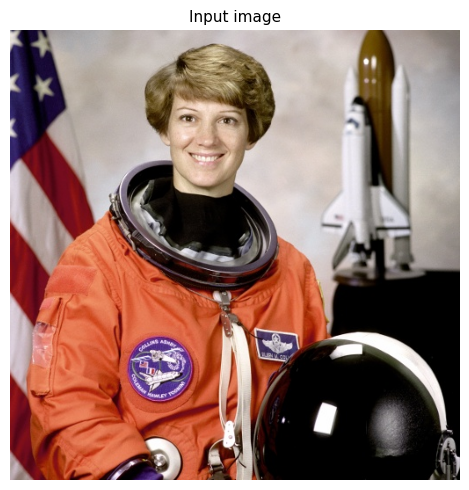

In [4]:
img = cv2.imread('./images/input.jpg')

print("type  :", type(img))
print("shape :", img.shape)        # (height, width, channels)
print("dtype :", img.dtype)
print("size  :", img.size, "values")

show([img], ["Input image"], cols=1, size=5)

`cv2.imread` returns a `numpy.ndarray`, not a special image object. The shape
`(512, 512, 3)` means 512 rows, 512 columns and 3 colour channels, and `uint8` means each
channel value is an integer from 0 to 255.

If the path is wrong, `cv2.imread` does **not** raise an error — it silently returns `None`,
and the failure only appears later as a confusing error. Checking for `None` immediately after
reading is the standard defensive habit.

In [5]:
missing = cv2.imread('./images/does_not_exist.jpg')
print("result for a wrong path:", missing)
print("this is why the check below matters")

if missing is None:
    print("-> the file could not be read")

result for a wrong path: None
this is why the check below matters
-> the file could not be read


### Step 2 — Load an image directly in grayscale

The conversion happens *while reading*, so only one channel is ever stored in memory.

colour   : (512, 512, 3) -> 786432 values
grayscale: (512, 512) -> 262144 values
memory saved: 67 %


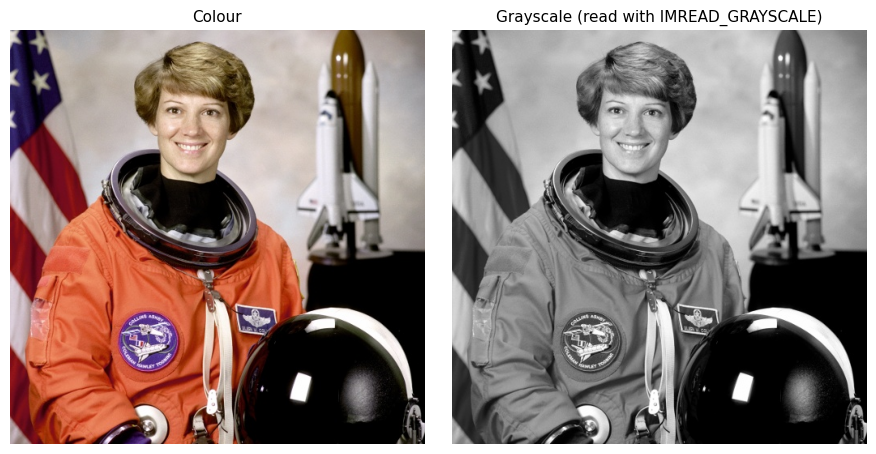

In [6]:
gray_img = cv2.imread('images/input.jpg', cv2.IMREAD_GRAYSCALE)

print("colour   :", img.shape, "->", img.size, "values")
print("grayscale:", gray_img.shape, "->", gray_img.size, "values")
print("memory saved:", round(100 * (1 - gray_img.size / img.size)), "%")

show([img, gray_img], ["Colour", "Grayscale (read with IMREAD_GRAYSCALE)"], cols=2, size=4.5)

### Step 3 — Save an image

In [7]:
ok = cv2.imwrite('images/output.jpg', gray_img)
print("save succeeded:", ok)
print("file size     :", os.path.getsize('images/output.jpg'), "bytes")

# read it back to confirm it is a valid image
check = cv2.imread('images/output.jpg', cv2.IMREAD_GRAYSCALE)
print("read back     :", check.shape, check.dtype)
print("identical to the original array:", np.array_equal(check, gray_img))

save succeeded: True
file size     : 85065 bytes
read back     : (512, 512) uint8
identical to the original array: False


The last line prints `False`. This is expected and worth understanding: `.jpg` is a **lossy**
format, so saving and re-reading does not return the exact same numbers. The cell below
measures how much the values actually moved.

In [8]:
d = np.abs(check.astype(np.int16) - gray_img.astype(np.int16))
print("largest change in any pixel :", int(d.max()))
print("average change              :", round(float(d.mean()), 2))
print("pixels changed              :", f"{100 * (d > 0).mean():.1f}%")

# PNG is lossless — the same test passes
cv2.imwrite('output/output.png', gray_img)
print("PNG round-trip identical    :",
      np.array_equal(cv2.imread('output/output.png', cv2.IMREAD_GRAYSCALE), gray_img))

largest change in any pixel : 2
average change              : 0.04
pixels changed              : 4.2%
PNG round-trip identical    : True


---
## Part 2 — Converting to different colour spaces

### Step 4 — Converting an image already in memory

`cv2.cvtColor` converts an array that has already been read, whereas `IMREAD_GRAYSCALE`
converts during reading. The two routes are **not** guaranteed to give byte-identical results,
as the check below shows.

identical to IMREAD_GRAYSCALE: False
largest difference           : 8
average difference           : 0.019


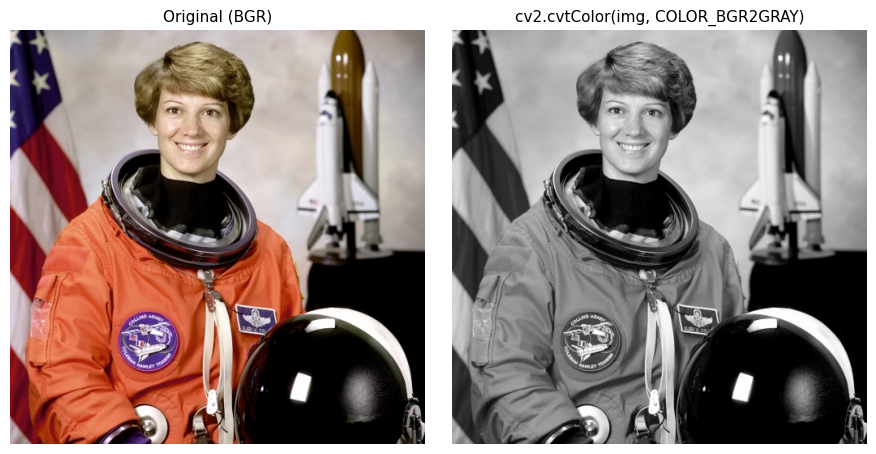

In [9]:
img = cv2.imread('./images/input.jpg')
gray_from_cvt = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

print("identical to IMREAD_GRAYSCALE:", np.array_equal(gray_from_cvt, gray_img))
print("largest difference           :",
      int(np.abs(gray_from_cvt.astype(np.int16) - gray_img.astype(np.int16)).max()))
print("average difference           :",
      round(float(np.abs(gray_from_cvt.astype(np.int16)
                         - gray_img.astype(np.int16)).mean()), 3))

show([img, gray_from_cvt], ["Original (BGR)", "cv2.cvtColor(img, COLOR_BGR2GRAY)"],
     cols=2, size=4.5)

The two are visually identical but differ by a few levels in some pixels. `IMREAD_GRAYSCALE`
asks the JPEG decoder to produce grayscale directly, which it does from the compressed
luminance data, while the other route decodes to full colour first and then converts. Two
different rounding paths, two slightly different results. Neither is wrong — but it is a
reminder not to assume that two routes to "the same" image produce the same bytes.

### Listing the available conversion flags

The manual gives this line:

```python
print [x for x in dir(cv2) if x.startswith('COLOR_')]
```

That is **Python 2** syntax and raises a `SyntaxError` in Python 3, where `print` is a function
and needs parentheses. The corrected version is below.

In [10]:
flags = [x for x in dir(cv2) if x.startswith('COLOR_')]
print("number of colour conversion flags:", len(flags))
print()

# print them in columns so the list stays readable
for i in range(0, 40, 4):
    print("".join(f"{f:<28}" for f in flags[i:i + 4]))
print("...")

number of colour conversion flags: 374

COLOR_BAYER_BG2BGR          COLOR_BAYER_BG2BGRA         COLOR_BAYER_BG2BGR_EA       COLOR_BAYER_BG2BGR_VNG      
COLOR_BAYER_BG2GRAY         COLOR_BAYER_BG2RGB          COLOR_BAYER_BG2RGBA         COLOR_BAYER_BG2RGB_EA       
COLOR_BAYER_BG2RGB_VNG      COLOR_BAYER_BGGR2BGR        COLOR_BAYER_BGGR2BGRA       COLOR_BAYER_BGGR2BGR_EA     
COLOR_BAYER_BGGR2BGR_VNG    COLOR_BAYER_BGGR2GRAY       COLOR_BAYER_BGGR2RGB        COLOR_BAYER_BGGR2RGBA       
COLOR_BAYER_BGGR2RGB_EA     COLOR_BAYER_BGGR2RGB_VNG    COLOR_BAYER_GB2BGR          COLOR_BAYER_GB2BGRA         
COLOR_BAYER_GB2BGR_EA       COLOR_BAYER_GB2BGR_VNG      COLOR_BAYER_GB2GRAY         COLOR_BAYER_GB2RGB          
COLOR_BAYER_GB2RGBA         COLOR_BAYER_GB2RGB_EA       COLOR_BAYER_GB2RGB_VNG      COLOR_BAYER_GBRG2BGR        
COLOR_BAYER_GBRG2BGRA       COLOR_BAYER_GBRG2BGR_EA     COLOR_BAYER_GBRG2BGR_VNG    COLOR_BAYER_GBRG2GRAY       
COLOR_BAYER_GBRG2RGB        COLOR_BAYER_GBRG2RGBA       

### Converting to YUV

YUV is the colour model used for television broadcasting. It separates **brightness** from
**colour**:

* **Y** — luminance, the physical brightness of the pixel
* **U** — the blue projection (blue minus luminance)
* **V** — the red projection (red minus luminance)

The reason this separation matters is bandwidth: the human eye is far more sensitive to
brightness than to colour, so U and V can be transmitted at lower resolution without a visible
loss. This is the basis of the chroma subsampling used in JPEG and in video.

YUV shape: (512, 512, 3)


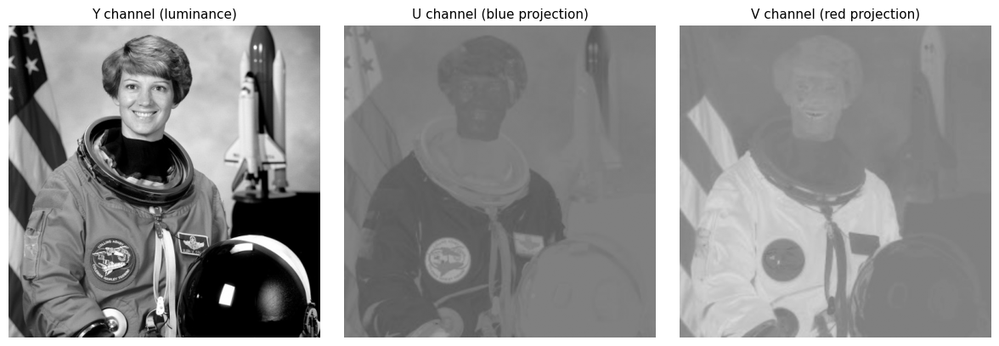

Y  matches the grayscale conversion closely: 0 max difference


In [11]:
yuv_img = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

print("YUV shape:", yuv_img.shape)

show([yuv_img[:, :, 0], yuv_img[:, :, 1], yuv_img[:, :, 2]],
     ["Y channel (luminance)", "U channel (blue projection)", "V channel (red projection)"],
     cols=3)

print("Y  matches the grayscale conversion closely:",
      int(np.abs(yuv_img[:, :, 0].astype(np.int16)
                 - gray_from_cvt.astype(np.int16)).max()), "max difference")

The Y channel looks almost exactly like the grayscale image, which confirms that it carries
the brightness. The U and V channels look flat and mid-grey because they store *deviations*
from the average colour, and most of their values sit close to 128.

In [12]:
for name, ch in zip("YUV", range(3)):
    c = yuv_img[:, :, ch]
    print(f"{name}: min {c.min():>3}  max {c.max():>3}  mean {c.mean():6.1f}  std {c.std():5.1f}")

Y: min   0  max 255  mean  115.4  std  75.1
U: min  87  max 166  mean  118.8  std  13.7
V: min 122  max 219  mean  151.0  std  28.6


### Comparing several colour spaces

The same image in four different representations, each split into its three channels.

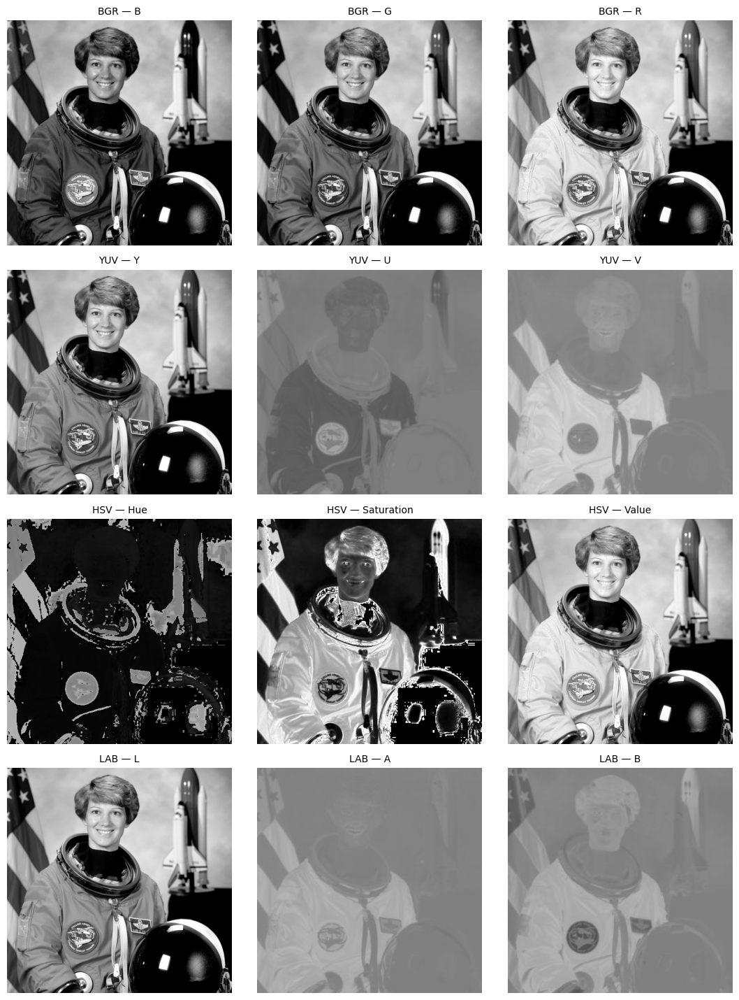

In [13]:
spaces = {
    "BGR": (img, ["B", "G", "R"]),
    "YUV": (cv2.cvtColor(img, cv2.COLOR_BGR2YUV), ["Y", "U", "V"]),
    "HSV": (cv2.cvtColor(img, cv2.COLOR_BGR2HSV), ["Hue", "Saturation", "Value"]),
    "LAB": (cv2.cvtColor(img, cv2.COLOR_BGR2LAB), ["L", "A", "B"]),
}

fig, axes = plt.subplots(len(spaces), 3, figsize=(11, 3.6 * len(spaces)))
for r, (space, (converted, names)) in enumerate(spaces.items()):
    for c in range(3):
        axes[r, c].imshow(converted[:, :, c], cmap='gray', vmin=0, vmax=255)
        axes[r, c].set_title(f"{space} — {names[c]}", fontsize=10)
        axes[r, c].axis('off')
plt.tight_layout()
plt.show()

---
## Task 1 — Geometric transformations

Geometric transformations change **where** each pixel is, not what value it holds. Every one of
them is an affine transformation described by a 2x3 matrix `M`, applied with `cv2.warpAffine`:

$$\begin{bmatrix} x' \\ y' \end{bmatrix} =
\begin{bmatrix} a & b & t_x \\ c & d & t_y \end{bmatrix}
\begin{bmatrix} x \\ y \\ 1 \end{bmatrix}$$

Because the new coordinates are rarely whole numbers, the output pixel values have to be
**interpolated** from the neighbouring input pixels.

### 1.1 Increase the size of the image (scaling)

`cv2.resize` changes the sampling grid. The interpolation method decides how the new pixels
are estimated, and the difference is very visible when enlarging.

| Method | Behaviour |
|---|---|
| `INTER_NEAREST` | copies the closest pixel — fast, blocky |
| `INTER_LINEAR` | weighted average of 4 neighbours — the default |
| `INTER_CUBIC` | fits a curve over 16 neighbours — slower, sharper |

original : (512, 512, 3)
enlarged : (1024, 1024, 3) (2.0x in each direction, 4x the pixels)


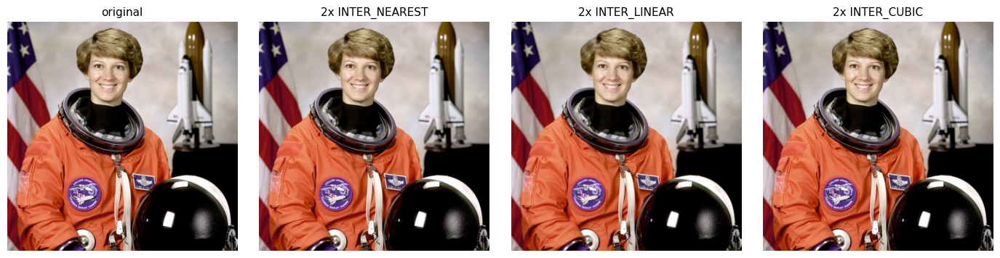

In [14]:
scale = 2.0
h, w = img.shape[:2]
new_size = (int(w * scale), int(h * scale))     # cv2.resize takes (width, height)

enlarged_nearest = cv2.resize(img, new_size, interpolation=cv2.INTER_NEAREST)
enlarged_linear  = cv2.resize(img, new_size, interpolation=cv2.INTER_LINEAR)
enlarged_cubic   = cv2.resize(img, new_size, interpolation=cv2.INTER_CUBIC)

print("original :", img.shape)
print("enlarged :", enlarged_cubic.shape, f"({scale}x in each direction,"
      f" {scale**2:.0f}x the pixels)")

show([img, enlarged_nearest, enlarged_linear, enlarged_cubic],
     ["original", "2x INTER_NEAREST", "2x INTER_LINEAR", "2x INTER_CUBIC"],
     cols=4, size=3.5)

To make the difference between the interpolation methods actually visible, the cell below
crops a small region and enlarges it by a factor of 8.

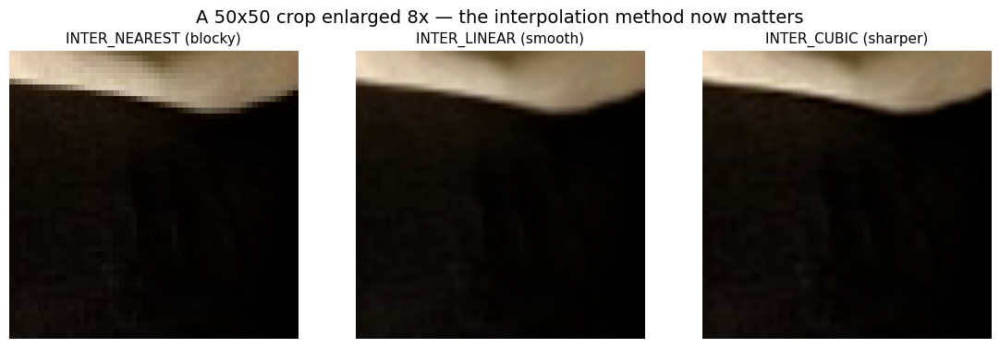

In [15]:
patch = img[180:230, 200:250]          # a small 50x50 region
big = (400, 400)

show([cv2.resize(patch, big, interpolation=m) for m in
      (cv2.INTER_NEAREST, cv2.INTER_LINEAR, cv2.INTER_CUBIC)],
     ["INTER_NEAREST (blocky)", "INTER_LINEAR (smooth)", "INTER_CUBIC (sharper)"],
     cols=3, size=3.8,
     suptitle="A 50x50 crop enlarged 8x — the interpolation method now matters")

Enlarging cannot create detail that was never captured. It only estimates intermediate
values, which is why all three results are blurry compared with a genuinely higher-resolution
photograph.

### 1.2 Rotate the image by 120 degrees

`cv2.getRotationMatrix2D(center, angle, scale)` builds the rotation matrix. Applying it
directly keeps the original canvas size, so the corners of the rotated image fall outside the
frame and are **cut off**.

The second version computes the size of the bounding box that the rotated image needs and
shifts the matrix so that nothing is lost.

In [16]:
angle = 120
center = (w // 2, h // 2)

# --- version 1: the straightforward call, which crops the corners ---
M_simple = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated_cropped = cv2.warpAffine(img, M_simple, (w, h))

print("rotation matrix:\n", np.round(M_simple, 3))

rotation matrix:
 [[-5.00000e-01  8.66000e-01  1.62297e+02]
 [-8.66000e-01 -5.00000e-01  6.05703e+02]]


original canvas : (512, 512)
expanded canvas : (699, 699)


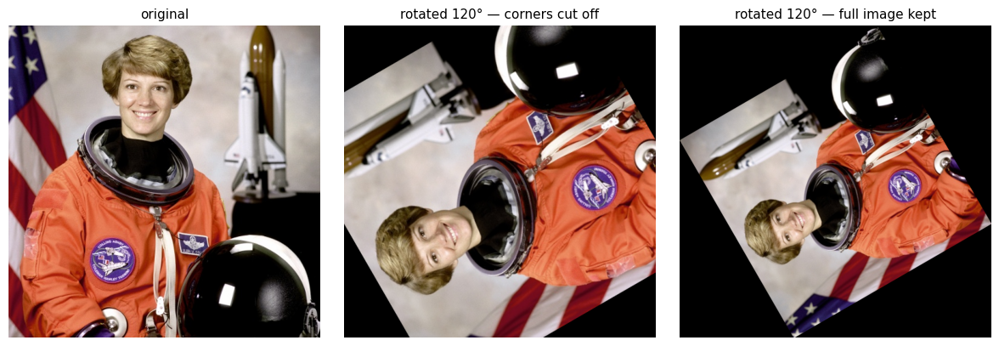

In [17]:
# --- version 2: expand the canvas so the whole image survives ---
M = cv2.getRotationMatrix2D(center, angle, 1.0)
cos, sin = abs(M[0, 0]), abs(M[0, 1])

new_w = int(h * sin + w * cos)          # bounding box of the rotated rectangle
new_h = int(h * cos + w * sin)

M[0, 2] += new_w / 2 - center[0]        # shift the centre to the new canvas
M[1, 2] += new_h / 2 - center[1]

rotated_full = cv2.warpAffine(img, M, (new_w, new_h))

print("original canvas :", (h, w))
print("expanded canvas :", (new_h, new_w))

show([img, rotated_cropped, rotated_full],
     ["original", f"rotated {angle}° — corners cut off", f"rotated {angle}° — full image kept"],
     cols=3, size=4)

The black areas in both results are pixels that have no source in the original image. By
default `warpAffine` fills them with zeros; `borderMode` can replicate the edge or wrap
instead.

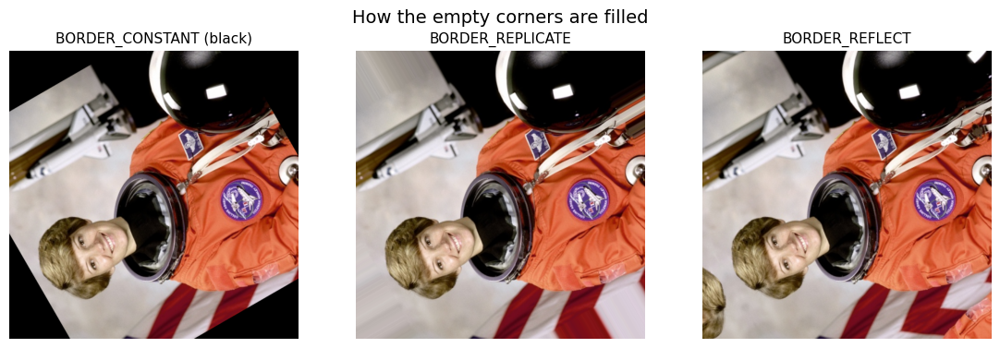

In [18]:
modes = [(cv2.BORDER_CONSTANT, "BORDER_CONSTANT (black)"),
         (cv2.BORDER_REPLICATE, "BORDER_REPLICATE"),
         (cv2.BORDER_REFLECT,  "BORDER_REFLECT")]

show([cv2.warpAffine(img, M_simple, (w, h), borderMode=m) for m, _ in modes],
     [t for _, t in modes], cols=3, size=3.8,
     suptitle="How the empty corners are filled")

Rotating in several steps is also a good way to see that interpolation is **lossy**:
rotating by 120° three times returns to the starting orientation, but not to the starting
pixel values.

identical to the original : False
average difference overall: 22.12   <- dominated by the corners lost to the canvas
average inside the circle : 3.0   <- interpolation error alone


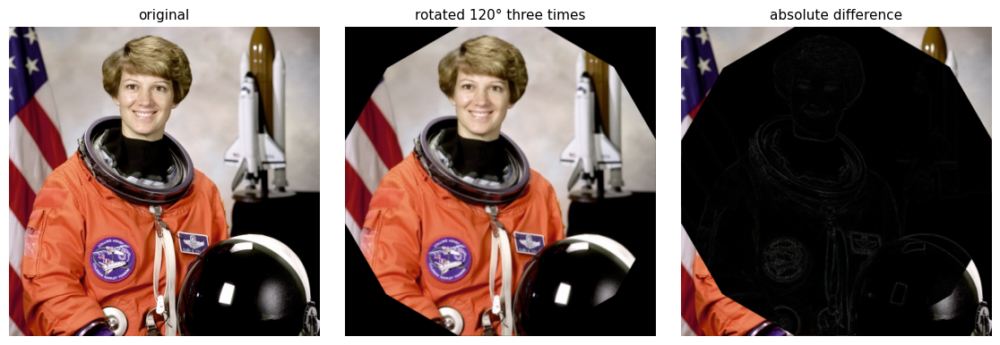

In [19]:
three_times = img.copy()
for _ in range(3):
    three_times = cv2.warpAffine(three_times,
                                 cv2.getRotationMatrix2D(center, 120, 1.0), (w, h))

d = cv2.absdiff(img, three_times)

# separate the two causes: the lost corners, and interpolation everywhere else
yy, xx = np.ogrid[:h, :w]
inside = (yy - center[1]) ** 2 + (xx - center[0]) ** 2 <= (min(h, w) / 2 - 10) ** 2

print("identical to the original :", np.array_equal(img, three_times))
print("average difference overall:", round(float(d.mean()), 2),
      "  <- dominated by the corners lost to the canvas")
print("average inside the circle :", round(float(d[inside].mean()), 2),
      "  <- interpolation error alone")

show([img, three_times, d],
     ["original", "rotated 120° three times", "absolute difference"],
     cols=3, size=3.8)

### 1.3 Shear operations

A shear slides each row (or column) sideways by an amount proportional to its distance from
the origin. Squares become parallelograms, and parallel lines stay parallel.

| Shear | Matrix | Effect |
|---|---|---|
| Horizontal | `[[1, k, 0], [0, 1, 0]]` | each row shifts right in proportion to its `y` |
| Vertical | `[[1, 0, 0], [k, 1, 0]]` | each column shifts down in proportion to its `x` |
| Both | `[[1, k, 0], [k, 1, 0]]` | combined |

horizontal shear matrix:
 [[1.  0.4 0. ]
 [0.  1.  0. ]]
output sizes: (512, 716) (716, 512) (716, 716)


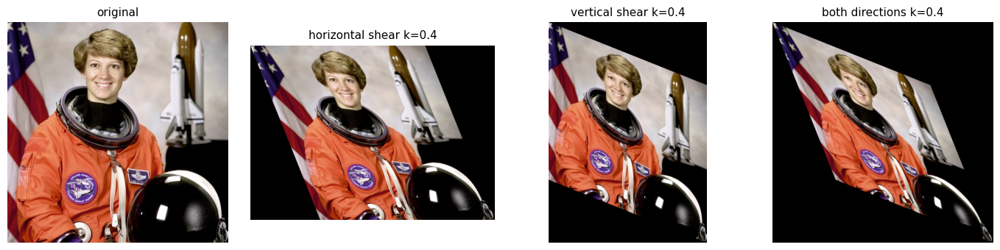

In [20]:
k = 0.4     # shear factor

M_shear_x = np.float32([[1, k, 0],
                        [0, 1, 0]])
M_shear_y = np.float32([[1, 0, 0],
                        [k, 1, 0]])
M_shear_xy = np.float32([[1, k, 0],
                         [k, 1, 0]])

# enlarge the canvas so the sheared image is not cut off
sheared_x  = cv2.warpAffine(img, M_shear_x,  (int(w + k * h), h))
sheared_y  = cv2.warpAffine(img, M_shear_y,  (w, int(h + k * w)))
sheared_xy = cv2.warpAffine(img, M_shear_xy, (int(w + k * h), int(h + k * w)))

print("horizontal shear matrix:\n", M_shear_x)
print("output sizes:", sheared_x.shape[:2], sheared_y.shape[:2], sheared_xy.shape[:2])

show([img, sheared_x, sheared_y, sheared_xy],
     ["original", f"horizontal shear k={k}", f"vertical shear k={k}",
      f"both directions k={k}"],
     cols=4, size=3.5)

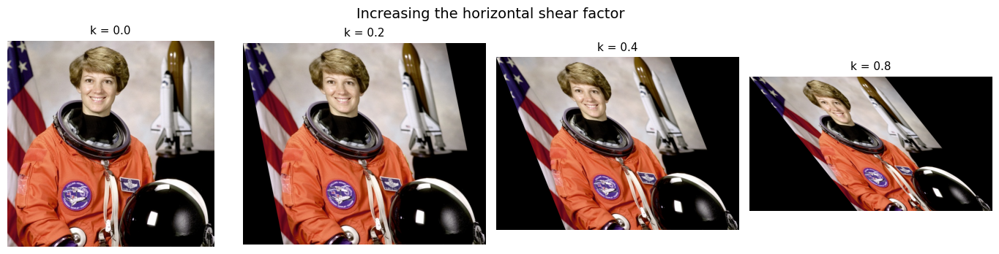

In [21]:
# the effect of the shear factor
ks = [0.0, 0.2, 0.4, 0.8]
show([cv2.warpAffine(img, np.float32([[1, kk, 0], [0, 1, 0]]), (int(w + kk * h), h))
      for kk in ks],
     [f"k = {kk}" for kk in ks], cols=4, size=3.5,
     suptitle="Increasing the horizontal shear factor")

### 1.4 All geometric transformations together

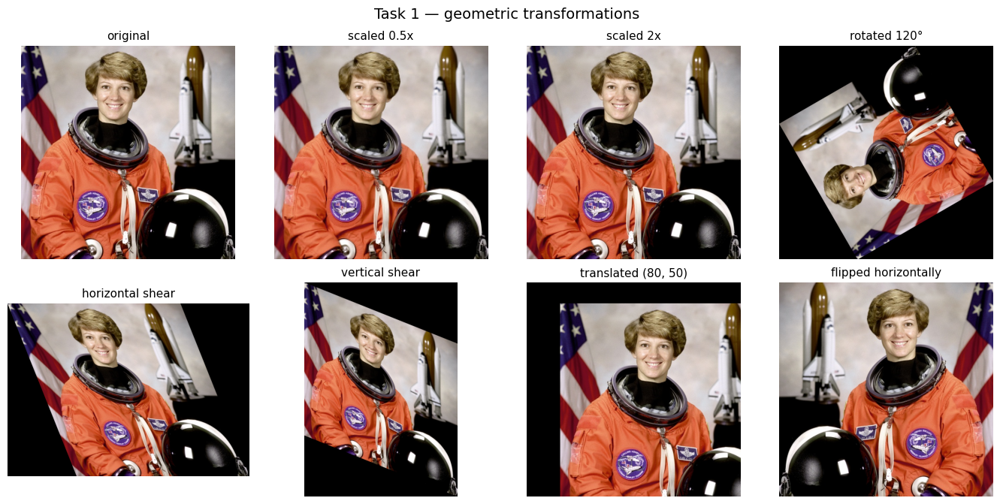

In [22]:
translated = cv2.warpAffine(img, np.float32([[1, 0, 80], [0, 1, 50]]), (w, h))
flipped = cv2.flip(img, 1)

geo = [(img, "original"),
       (cv2.resize(img, (w // 2, h // 2)), "scaled 0.5x"),
       (enlarged_cubic, "scaled 2x"),
       (rotated_full, "rotated 120°"),
       (sheared_x, "horizontal shear"),
       (sheared_y, "vertical shear"),
       (translated, "translated (80, 50)"),
       (flipped, "flipped horizontally")]

show([g[0] for g in geo], [g[1] for g in geo], cols=4, size=3.4,
     suptitle="Task 1 — geometric transformations")

---
## Task 2 — Intensity transformations

Intensity transformations are the opposite of geometric ones: every pixel stays exactly where
it is, and only its **value** changes. Each is a function `s = T(r)` applied independently to
every pixel, where `r` is the input intensity and `s` the output.

All three transformations below are applied to the grayscale image.

In [23]:
r_img = gray_from_cvt                      # the grayscale image
print("input image:", r_img.shape, r_img.dtype,
      "| range", r_img.min(), "-", r_img.max(),
      "| mean", round(float(r_img.mean()), 1))

input image: (512, 512) uint8 | range 0 - 255 | mean 115.4


### 2.1 Negative image

$$s = L - 1 - r = 255 - r$$

The transformation is its own inverse, and it makes detail in dark regions easier to see —
which is why it is standard practice when reading X-ray film.

original mean: 115.4 | negative mean: 139.6 | the two sum to 255
applying it twice returns the original: True


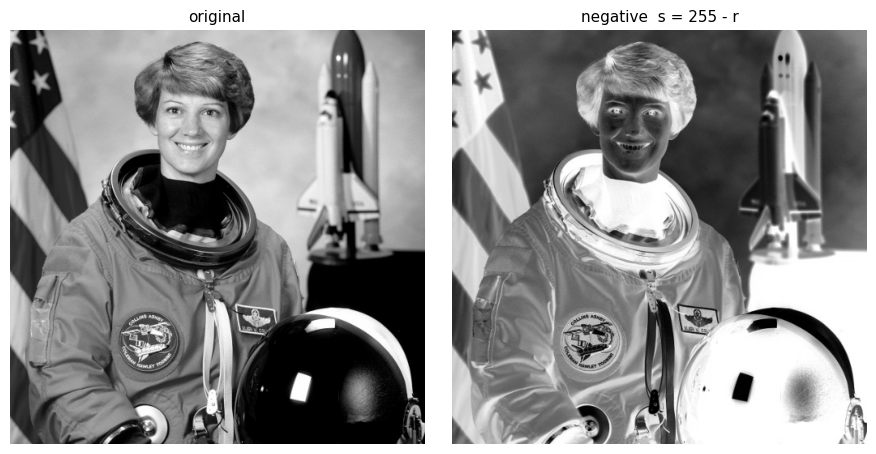

In [24]:
negative = 255 - r_img

print("original mean:", round(float(r_img.mean()), 1),
      "| negative mean:", round(float(negative.mean()), 1),
      "| the two sum to 255")
print("applying it twice returns the original:",
      np.array_equal(255 - negative, r_img))

show([r_img, negative], ["original", "negative  s = 255 - r"], cols=2, size=4.5)

### 2.2 Log transformation

$$s = c \cdot \log(1 + r)$$

The constant `c` is chosen so that the largest input maps exactly to 255:

$$c = \frac{255}{\log(1 + r_{max})}$$

For an 8-bit image this gives `c = 255 / log(256) ≈ 45.99`.

The log curve is steep for small values and flat for large ones, so it **expands** the dark
range and **compresses** the bright range. It brightens an image and reveals detail in shadows.

constant c   : 45.986
input  mean  : 115.4
output mean  : 187.6 -> brighter
output range : 0 - 255


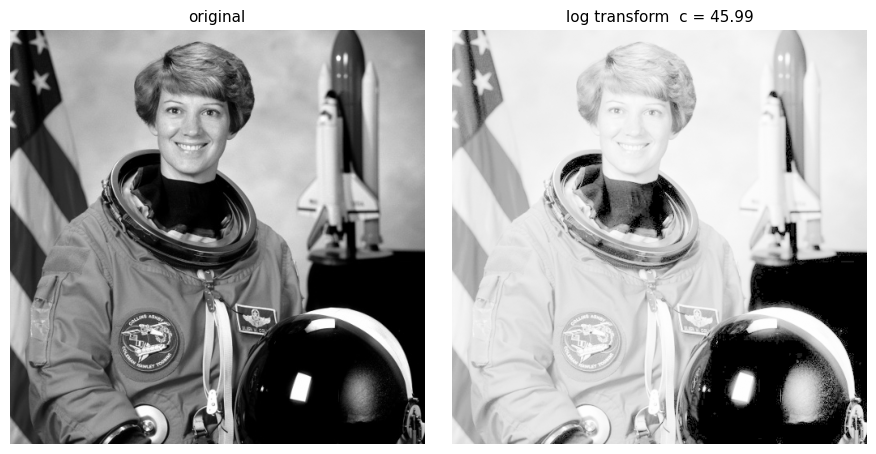

In [25]:
# int() matters here: r_img.max() is a uint8, and 1 + 255 would wrap round to 0
c = 255 / np.log(1 + int(r_img.max()))
log_img = (c * np.log(1 + r_img.astype(np.float64))).astype(np.uint8)

print("constant c   :", round(float(c), 3))
print("input  mean  :", round(float(r_img.mean()), 1))
print("output mean  :", round(float(log_img.mean()), 1), "-> brighter")
print("output range :", log_img.min(), "-", log_img.max())

show([r_img, log_img], ["original", f"log transform  c = {c:.2f}"], cols=2, size=4.5)

inverse log mean: 32.1 -> darker
log then inverse log recovers the original closely: 5 max difference


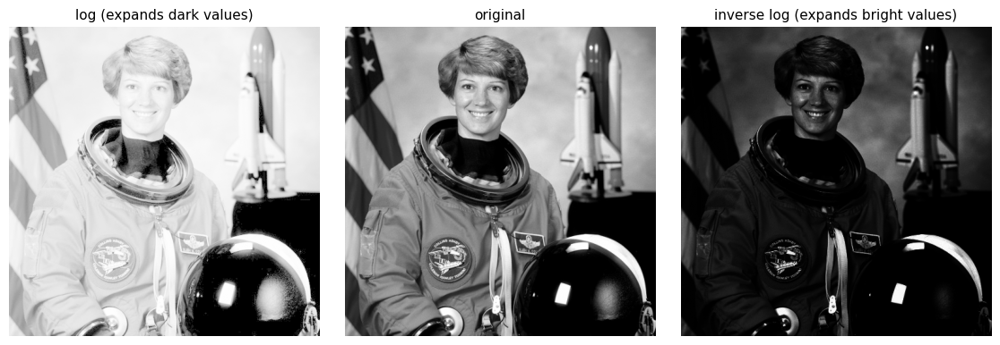

In [26]:
# the inverse-log (exponential) transform does the opposite: s = exp(r / c) - 1
inv_log = np.exp(r_img.astype(np.float64) / c) - 1
inv_log = np.clip(inv_log, 0, 255).astype(np.uint8)

print("inverse log mean:", round(float(inv_log.mean()), 1), "-> darker")
print("log then inverse log recovers the original closely:",
      int(np.abs((np.exp(log_img.astype(np.float64) / c) - 1)
                 - r_img.astype(np.float64)).max()), "max difference")

show([log_img, r_img, inv_log],
     ["log (expands dark values)", "original", "inverse log (expands bright values)"],
     cols=3, size=3.8)

### 2.3 Power-law (gamma) transformation

$$s = c \cdot r^{\gamma}$$

With the input normalised to the range 0–1 and `c = 255`:

* **γ < 1** brightens the image and expands the dark tones
* **γ = 1** leaves the image unchanged
* **γ > 1** darkens the image and expands the bright tones

Gamma is the correction applied by every display device, which is why this transformation is
also called *gamma correction*.

gamma = 0.2   mean  190.3  std  73.9
gamma = 0.5   mean  153.0  std  76.5
gamma = 1.0   mean  115.4  std  75.1
gamma = 1.5   mean   90.8  std  70.6
gamma = 2.5   mean   61.4  std  61.0
gamma = 5.0   mean   29.3  std  44.3


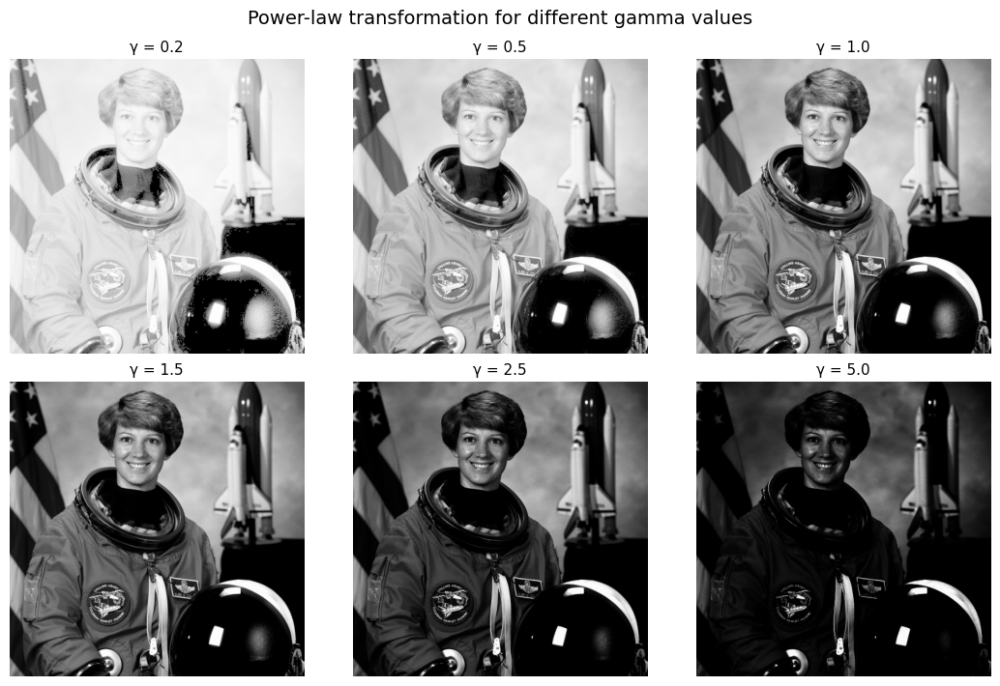

In [27]:
def power_law(image, gamma, c=1.0):
    """s = c * r^gamma, computed on values normalised to 0-1."""
    normalised = image.astype(np.float64) / 255.0
    out = c * np.power(normalised, gamma)
    return np.clip(out * 255, 0, 255).astype(np.uint8)


gammas = [0.2, 0.5, 1.0, 1.5, 2.5, 5.0]
imgs = [power_law(r_img, g) for g in gammas]

for g, im in zip(gammas, imgs):
    print(f"gamma = {g:<5} mean {im.mean():6.1f}  std {im.std():5.1f}")

show(imgs, [f"γ = {g}" for g in gammas], cols=3, size=3.6,
     suptitle="Power-law transformation for different gamma values")

### 2.4 Choosing a gamma that increases the contrast

The task asks for a gamma that **increases the contrast**. Standard deviation is a reasonable
numerical measure of contrast, so the cell below computes it across a range of gamma values and
picks the best one rather than guessing.

original standard deviation : 75.09
best gamma                  : 0.6
its standard deviation      : 76.7


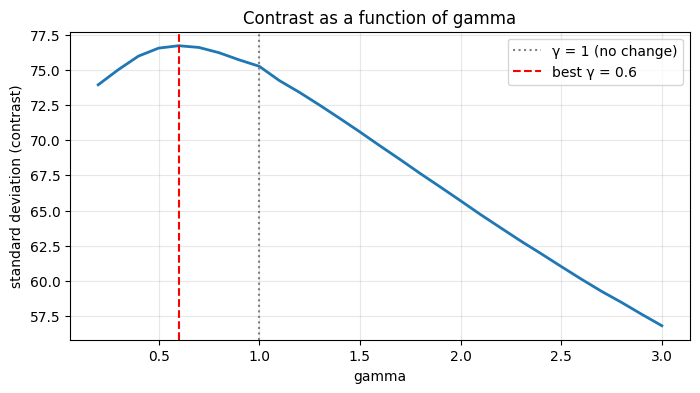

In [28]:
candidates = np.arange(0.2, 3.05, 0.1)
stds = [power_law(r_img, g).std() for g in candidates]

best = candidates[int(np.argmax(stds))]
print("original standard deviation :", round(float(r_img.std()), 2))
print("best gamma                  :", round(float(best), 2))
print("its standard deviation      :", round(float(power_law(r_img, best).std()), 2))

plt.figure(figsize=(8, 4))
plt.plot(candidates, stds, linewidth=2)
plt.axvline(1.0, color='grey', linestyle=':', label='γ = 1 (no change)')
plt.axvline(best, color='red', linestyle='--', label=f'best γ = {best:.1f}')
plt.xlabel("gamma")
plt.ylabel("standard deviation (contrast)")
plt.title("Contrast as a function of gamma")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

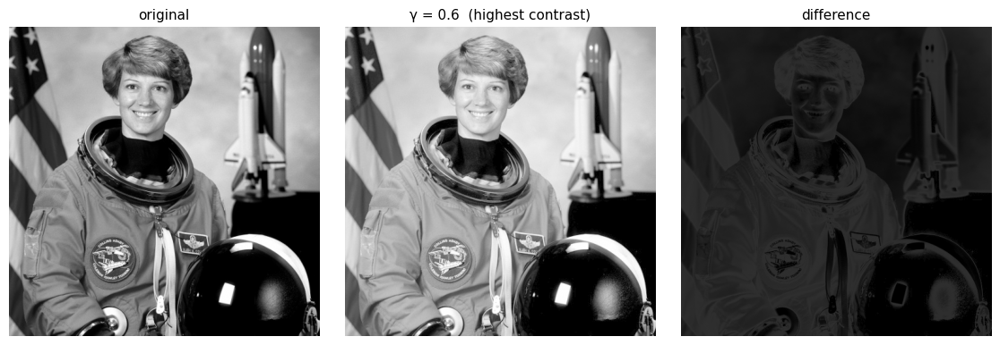

In [29]:
best_img = power_law(r_img, best)

show([r_img, best_img, cv2.absdiff(r_img, best_img)],
     ["original", f"γ = {best:.1f}  (highest contrast)", "difference"],
     cols=3, size=3.8)

**Reading the result honestly.** The gain is small — the standard deviation rises from about
75 to about 77. That is not a failure of the method; it is a fact about this image. The
original already spans the full range from 0 to 255 with a broad, well-spread histogram, so
there is little headroom left for a single monotonic curve to exploit.

Gamma does not add contrast out of nothing. It **redistributes** it: γ < 1 takes contrast from
the bright tones and gives it to the dark ones, and γ > 1 does the reverse. The overall
standard deviation therefore moves only slightly, while the *local* effect on shadows or
highlights can be large — which is what the images above show. For an image that occupies only
part of the range, the same procedure would produce a much larger gain.

### 2.5 The transformation curves

Plotting `s` against `r` shows at a glance what each transformation does. The diagonal is the
identity; a curve above it brightens, a curve below it darkens, and the steeper the curve is
over a range of inputs, the more contrast that range receives.

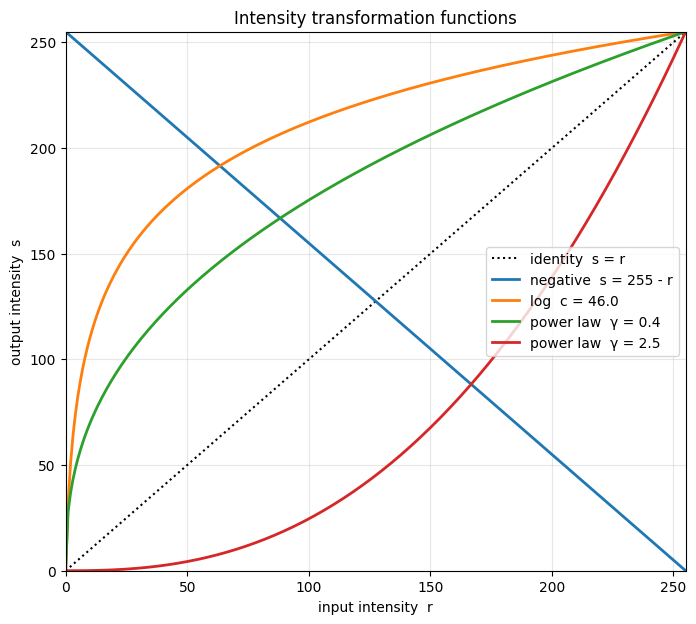

In [30]:
r = np.arange(256)

plt.figure(figsize=(8, 7))
plt.plot(r, r, 'k:', label='identity  s = r', linewidth=1.5)
plt.plot(r, 255 - r, label='negative  s = 255 - r', linewidth=2)
plt.plot(r, c * np.log(1 + r), label=f'log  c = {c:.1f}', linewidth=2)
for g in [0.4, 2.5]:
    plt.plot(r, 255 * (r / 255) ** g, label=f'power law  γ = {g}', linewidth=2)

plt.xlabel("input intensity  r")
plt.ylabel("output intensity  s")
plt.title("Intensity transformation functions")
plt.legend()
plt.grid(alpha=0.3)
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.show()

### 2.6 Histograms

The histogram makes the effect on the distribution of values explicit.

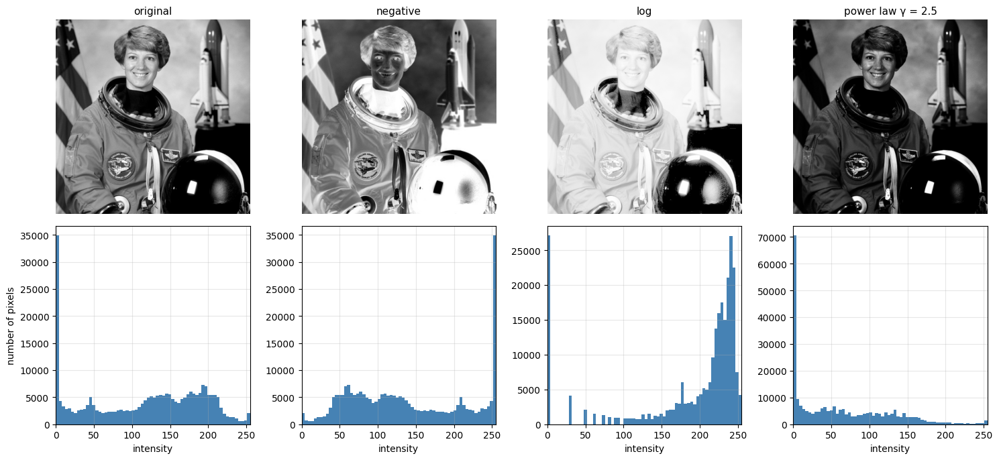

In [31]:
sets = [(r_img, "original"), (negative, "negative"),
        (log_img, "log"), (power_law(r_img, 2.5), "power law γ = 2.5")]

fig, axes = plt.subplots(2, 4, figsize=(15, 7))
for k, (im, t) in enumerate(sets):
    axes[0, k].imshow(im, cmap='gray', vmin=0, vmax=255)
    axes[0, k].set_title(t, fontsize=11)
    axes[0, k].axis('off')
    axes[1, k].hist(im.ravel(), bins=64, range=(0, 255), color='steelblue')
    axes[1, k].set_xlim(0, 255)
    axes[1, k].set_xlabel("intensity")
    axes[1, k].grid(alpha=0.3)
axes[1, 0].set_ylabel("number of pixels")
plt.tight_layout()
plt.show()

### 2.7 All intensity transformations together

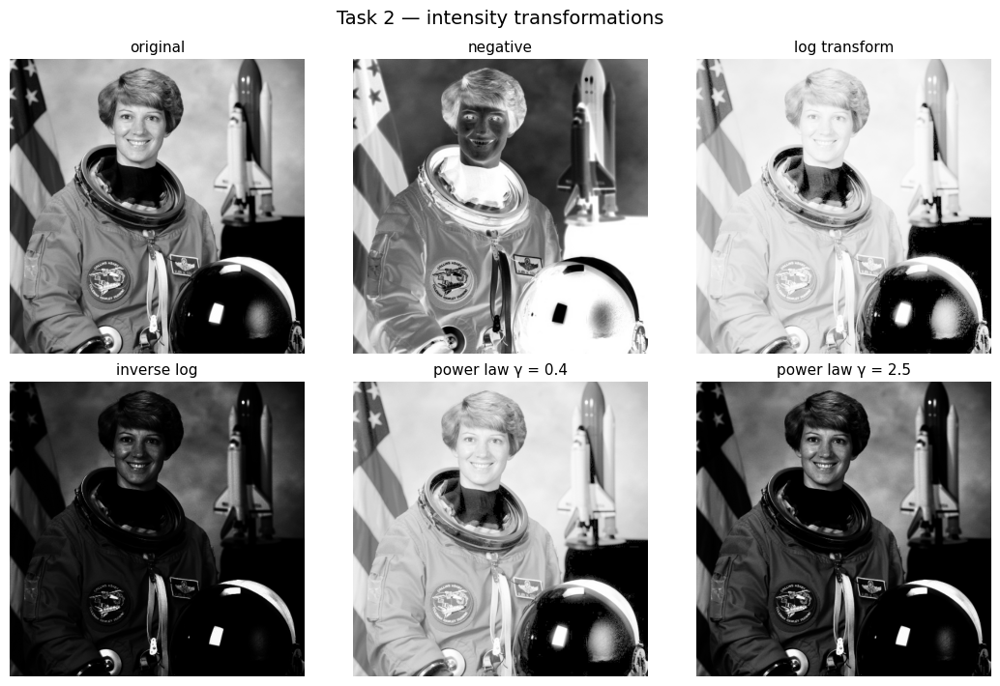

Saved: output/lab3_geometric_summary.png
Saved: output/lab3_intensity_summary.png


In [32]:
inten = [(r_img, "original"), (negative, "negative"),
         (log_img, "log transform"), (inv_log, "inverse log"),
         (power_law(r_img, 0.4), "power law γ = 0.4"),
         (power_law(r_img, 2.5), "power law γ = 2.5")]

show([i[0] for i in inten], [i[1] for i in inten], cols=3, size=3.6,
     suptitle="Task 2 — intensity transformations")

# save a summary figure for the report
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for ax, (im, t) in zip(axes.flat, inten):
    ax.imshow(im, cmap='gray', vmin=0, vmax=255)
    ax.set_title(t, fontsize=11)
    ax.axis('off')
plt.tight_layout()
plt.savefig('output/lab3_intensity_summary.png', dpi=120, bbox_inches='tight')
plt.close()

fig, axes = plt.subplots(2, 4, figsize=(14, 7.5))
for ax, (im, t) in zip(axes.flat, geo):
    ax.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    ax.set_title(t, fontsize=11)
    ax.axis('off')
plt.tight_layout()
plt.savefig('output/lab3_geometric_summary.png', dpi=120, bbox_inches='tight')
plt.close()

print("Saved: output/lab3_geometric_summary.png")
print("Saved: output/lab3_intensity_summary.png")

---
## Conclusion

**Reading, displaying and saving.** `cv2.imread` returns a plain NumPy array in **BGR** order,
and returns `None` rather than raising an error when the path is wrong — so the result must be
checked. Saving to `.jpg` is lossy: re-reading the file does not give back the same numbers,
while `.png` is lossless and does. Inside Jupyter, `cv2.imshow` with `cv2.waitKey` opens a
blocking external window and can freeze the kernel, so Matplotlib is the practical choice.

**Colour spaces.** OpenCV offers roughly 190 conversion flags. YUV separates brightness (Y)
from colour (U, V), which is why its Y channel is almost identical to the grayscale
conversion, and why video and JPEG compression store colour at a lower resolution than
brightness.

**Geometric transformations** change pixel *positions*. All of them — scaling, rotation,
shear, translation — are affine transformations expressed as a 2x3 matrix and applied with
`cv2.warpAffine`. Two practical points came out of the work: rotating with the default canvas
size **crops the corners**, and the output size has to be computed from the bounding box to
avoid it; and because new pixel positions are not whole numbers, every transformation
interpolates, which makes it lossy — rotating by 120° three times does not restore the
original pixel values.

**Intensity transformations** change pixel *values* and leave positions untouched. The
negative inverts the range, the log transform expands dark tones and compresses bright ones,
and the power law does either depending on gamma. Rather than guessing a gamma that increases
contrast, standard deviation was measured across a range of values and the maximum was
selected, which is a defensible way to justify the choice.

---

### Resources
- https://www.geeksforgeeks.org/image-transformations-using-opencv-in-python/
- https://www.thepythoncode.com/article/image-transformations-using-opencv-in-python
- https://medium.com/@khanhson0811/basic-intensity-transformation-functions-and-example-with-opencv-1a56932f34ac
- OpenCV geometric transformations: https://docs.opencv.org/